In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import gc
import sys
import time
import gc
import itertools
import tqdm
import time

from sklearn.preprocessing import LabelEncoder
import scipy.stats as ss

if os.name=='nt':
    try:
        mingw_path = 'C:\\Program Files\\mingw-w64\\x86_64-8.1.0-posix-seh-rt_v6-rev0\\mingw64\\bin'
        os.environ['PATH'] = mingw_path + ';' + os.environ['PATH']
    except:
        pass
    
import xgboost as xgb
from sklearn.metrics import mean_squared_error 
from numba import jit

%matplotlib inline

In [2]:
# Load data
train = pd.read_csv('all/sales_train.csv.gz')
test = pd.read_csv('all/test.csv.gz')
shop = pd.read_csv('all/shops-translated.csv')
item = pd.read_csv('all/item_category.csv')

test.set_index('ID', inplace=True)
item.drop(['item_name_translated'], axis=1, inplace=True)
shop.drop(['Name'], axis=1, inplace=True)

le = LabelEncoder()
item['item_cat1'] = le.fit_transform(item['item_cat1'].astype(str))
item['item_cat2'] = le.fit_transform(item['item_cat2'].astype(str))
shop['City'] = le.fit_transform(shop['City'])
shop['Type'] = le.fit_transform(shop['Type'])

train = train.merge(shop, on='shop_id', how='left')
train = train.merge(item, on='item_id', how='left')

In [4]:
train['date'] = pd.to_datetime(train['date'], format='%d.%m.%Y')

In [6]:
train.head()

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,City,Type,item_cat1,item_cat2
0,2013-01-02,0,59,22154,999.00,1.0,27,1,3,9
1,2013-01-03,0,25,2552,899.00,1.0,8,5,12,56
2,2013-01-05,0,25,2552,899.00,-1.0,8,5,12,56
3,2013-01-06,0,25,2554,1709.05,1.0,8,5,12,56
4,2013-01-15,0,25,2555,1099.00,1.0,8,5,12,15


In [57]:
x = train.pivot_table(index=['item_id'],
                      columns='date',
                      values=['item_price', 'item_cnt_day'],
                      aggfunc=np.sum)

In [58]:
cnt = x.loc[:, 'item_cnt_day'].fillna(0.0)

In [59]:
price = x.loc[:, 'item_price'].fillna(method='ffill', axis='columns').fillna(method='bfill', axis='columns')

In [ ]:
# plots
plt.plot(cnt.loc[22140])

plt.figure(figsize=(16, 9))
plt.plot(price.loc[22143, index])

start = pd.datetime(2014, 3, 1)
end = pd.datetime(2014, 5, 1)
index = pd.date_range(start, end)
plt.figure(figsize=(16, 9))
plt.plot(cnt.loc[22143, index])

start = pd.datetime(2015, 3, 1)
end = pd.datetime(2015, 5, 1)
index = pd.date_range(start, end)
plt.figure(figsize=(16, 9))
plt.plot(cnt.loc[22140, index])

plt.figure(figsize=(16, 9))
for n in range(200):
    plt.plot(cnt.columns, cnt.iloc[n, :])

In [125]:
cnt.columns

DatetimeIndex(['2013-01-01', '2013-01-02', '2013-01-03', '2013-01-04',
               '2013-01-05', '2013-01-06', '2013-01-07', '2013-01-08',
               '2013-01-09', '2013-01-10',
               ...
               '2015-10-22', '2015-10-23', '2015-10-24', '2015-10-25',
               '2015-10-26', '2015-10-27', '2015-10-28', '2015-10-29',
               '2015-10-30', '2015-10-31'],
              dtype='datetime64[ns]', name='date', length=1034, freq=None)

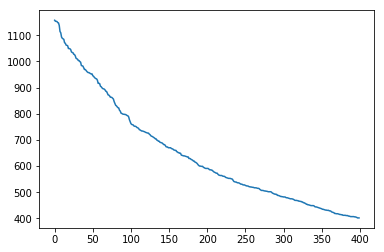

In [129]:
# The 500 most sold items
start = pd.datetime(2014, 11, 1)
end = pd.datetime(2015, 10, 31)
index = pd.date_range(start, end)
plt.plot(cnt.loc[:, index].sum(axis=1).sort_values(ascending=False).values[100:500])
best_sold = cnt.sum(axis=1).sort_values(ascending=False).index.tolist()

In [130]:
cnt_best_sold = cnt.loc[best_sold]
price_best_sold = price.loc[best_sold]

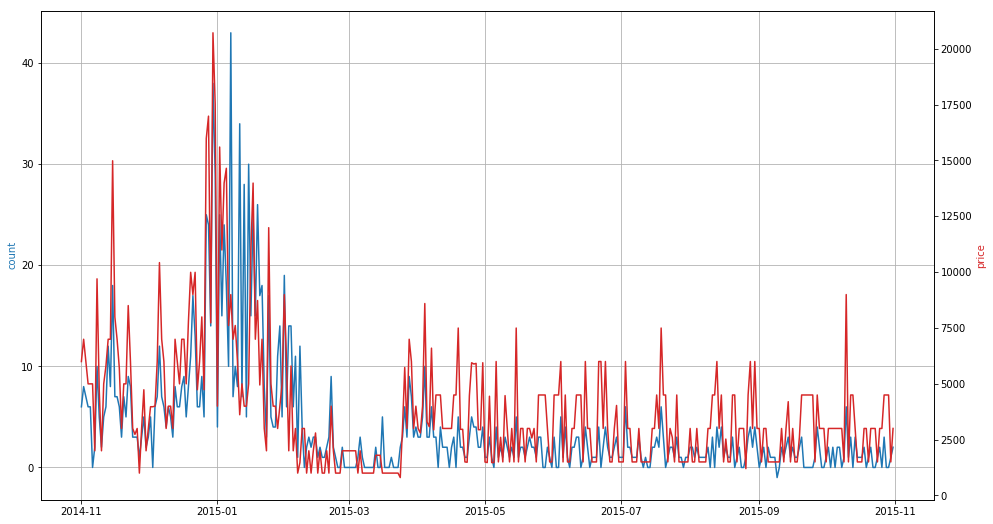

In [176]:
start = pd.datetime(2014, 11, 1)
end = pd.datetime(2015, 10, 31)
index = pd.date_range(start, end)
idx = 1

plt.figure(figsize=(16, 9))
plt.plot(cnt_best_sold.loc[best_sold[idx], index])
#plt.plot(cnt_best_sold.loc[best_sold[idx], index].rolling(window=7).mean(), label='7 days')
#plt.plot(cnt_best_sold.loc[best_sold[idx], index].rolling(window=14).mean(), label='14 days')
#plt.plot(cnt_best_sold.loc[best_sold[idx], index].rolling(window=21).mean(), label='21 days')
#plt.plot(cnt_best_sold.loc[best_sold[idx], index].rolling(window=28).mean(), label='28 days')
plt.grid()
#plt.ylim((0, 50))
plt.ylabel('count', color='tab:blue')

ax2 = plt.twinx()
color = 'tab:red'
ax2.set_ylabel('price', color=color)  # we already handled the x-label with ax1
plt.plot(price.loc[best_sold[idx], index], color=color)
#ax2.tick_params(axis='y', labelcolor=color)

C:\Users\lyaa\AppData\Local\Continuum\miniconda3\envs\kaggle\lib\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


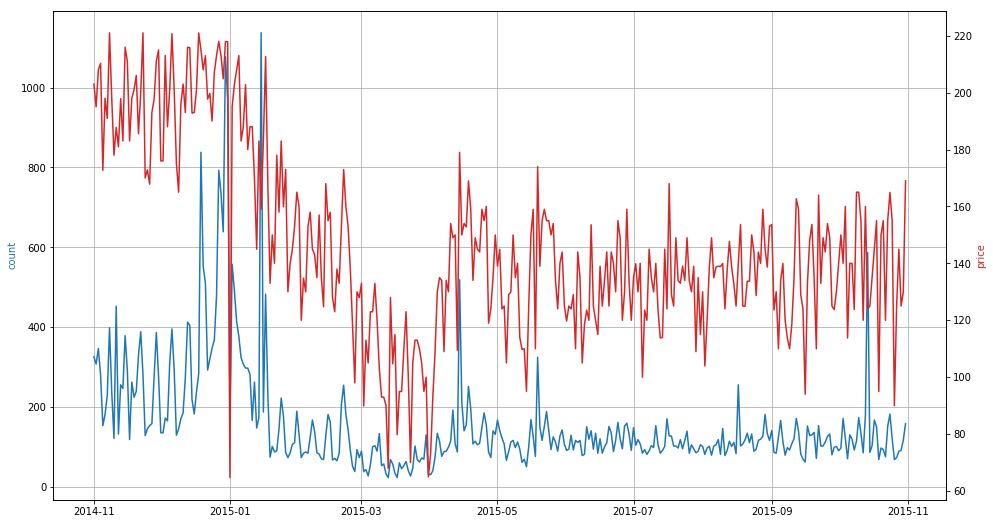

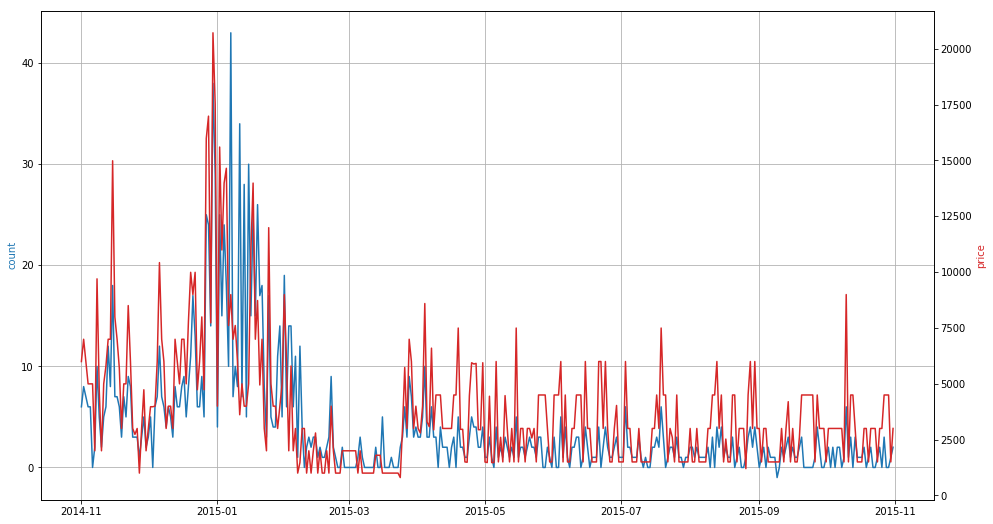

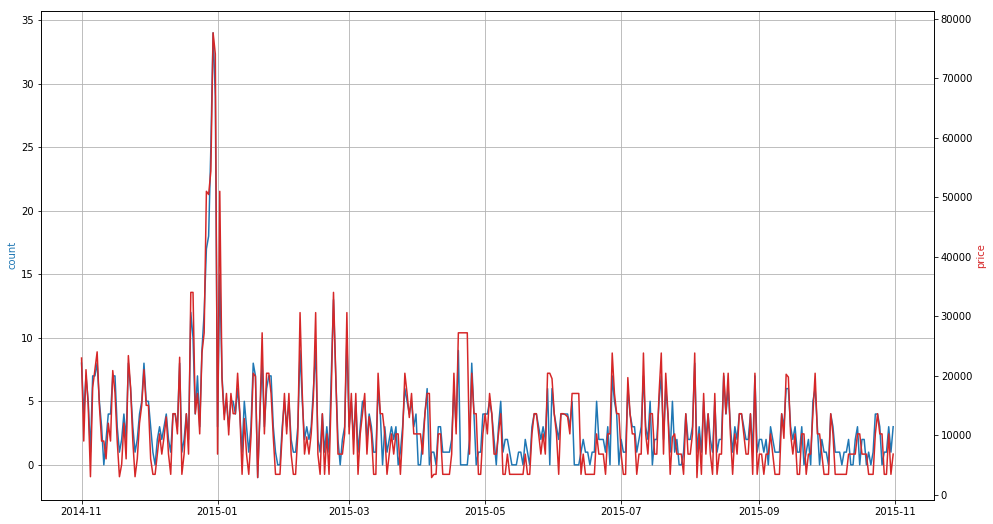

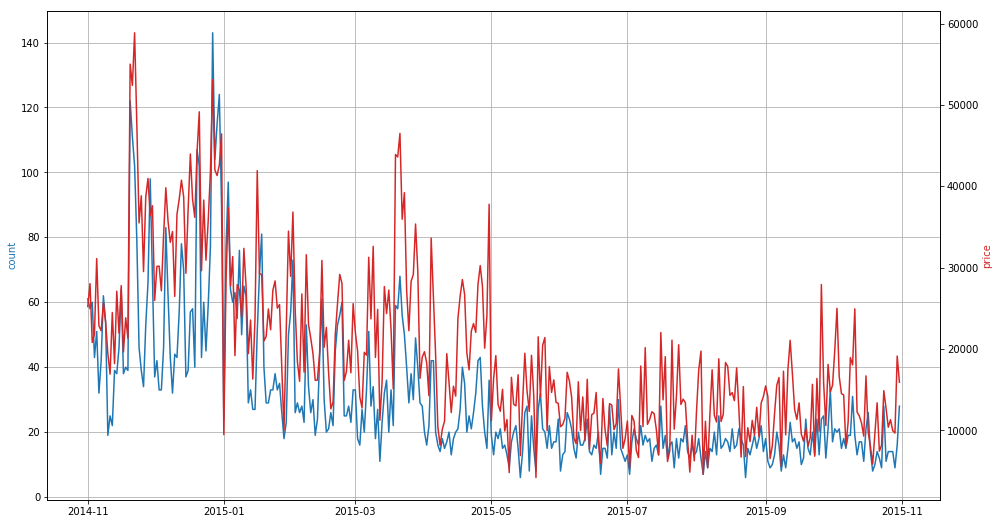

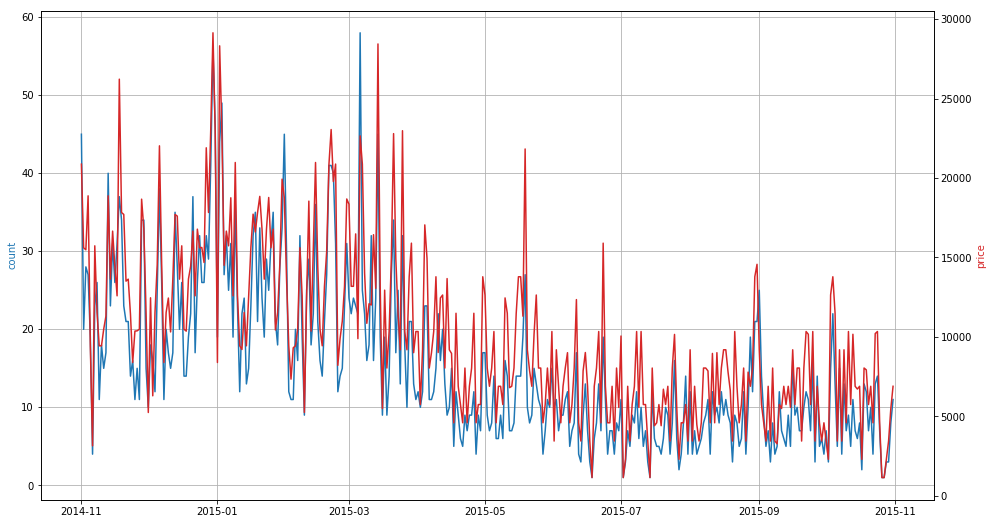

...

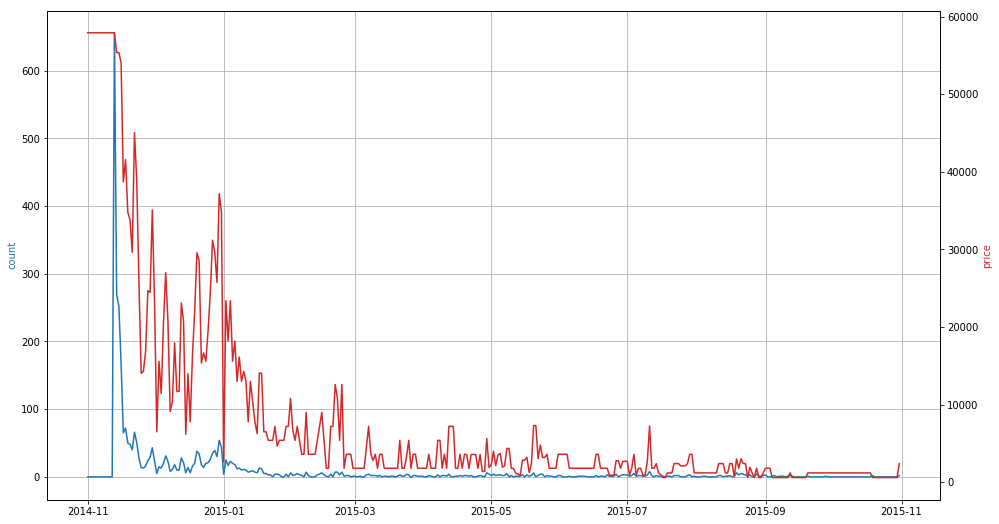

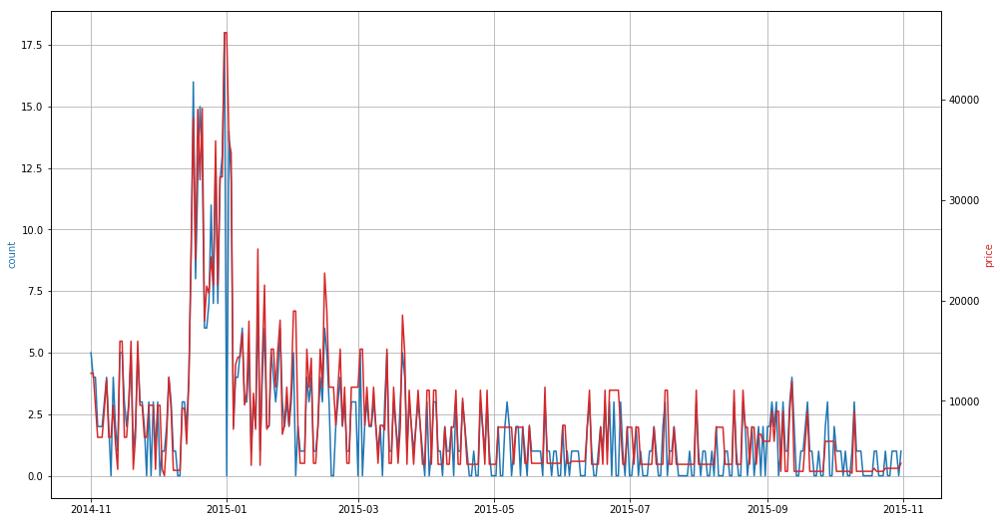

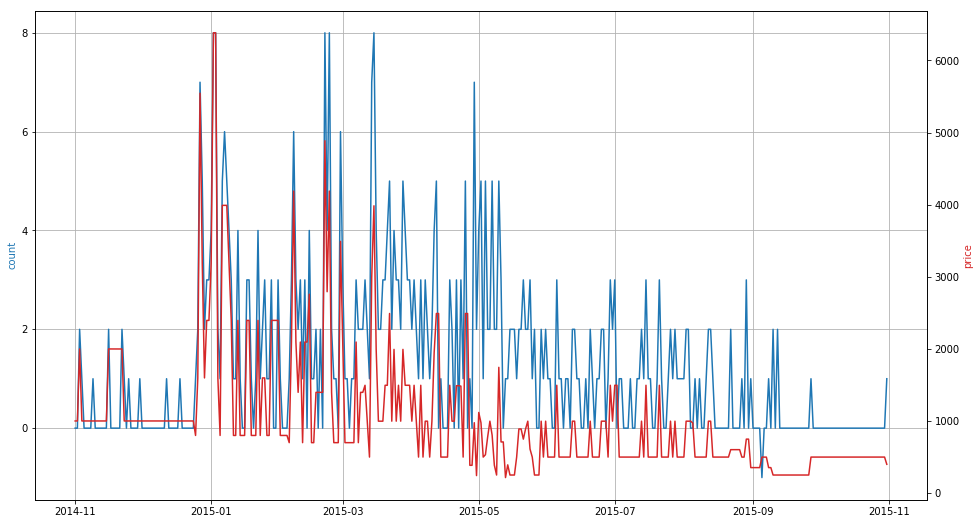

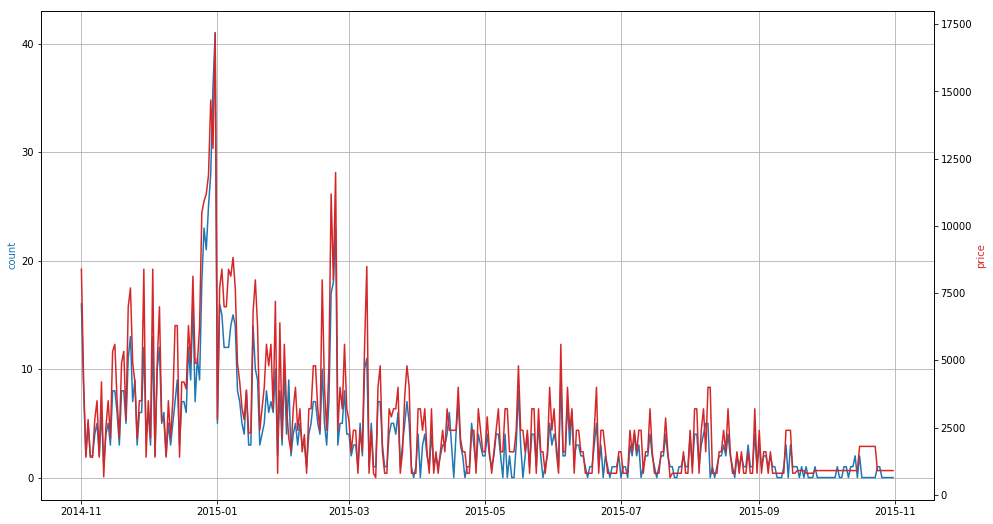

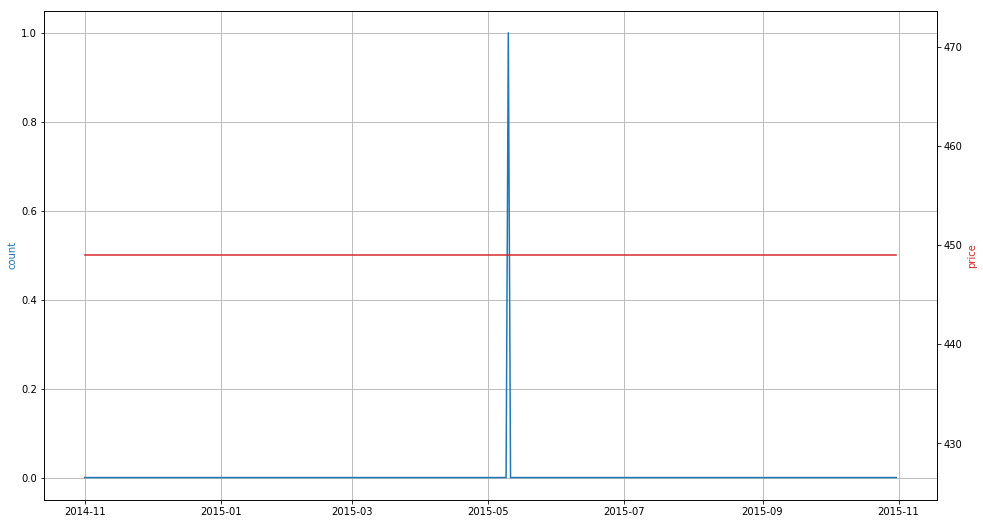

In [177]:
for idx in range(100):
    plt.figure(figsize=(16, 9))
    plt.plot(cnt_best_sold.loc[best_sold[idx], index])
    plt.grid()
    plt.ylabel('count', color='tab:blue')

    ax2 = plt.twinx()
    color = 'tab:red'
    ax2.set_ylabel('price', color=color)  # we already handled the x-label with ax1
    plt.plot(price.loc[best_sold[idx], index], color=color)
    

In [178]:
# Item properties of the best sold items
item[item.item_id.isin(best_sold[:10])]

,item_id,item_cat1,item_cat2
287,6675,8,43
646,3732,9,42
995,16787,9,42
1628,3734,9,58
2515,1855,16,52
2613,2808,16,52
2729,3731,16,52
4383,5822,18,44
20312,20949,10,8
22133,17717,13,60


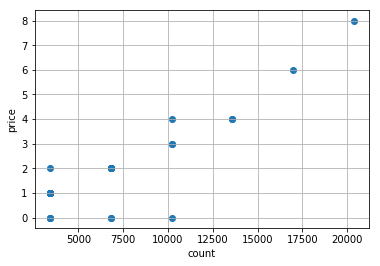

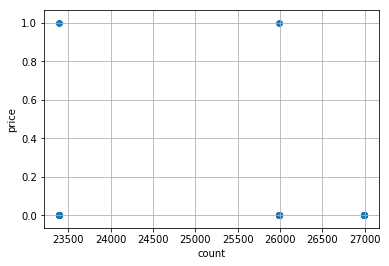

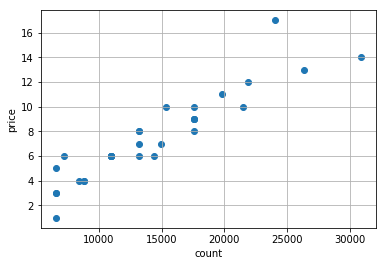

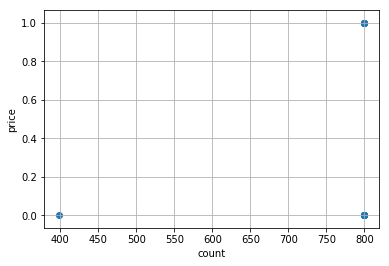

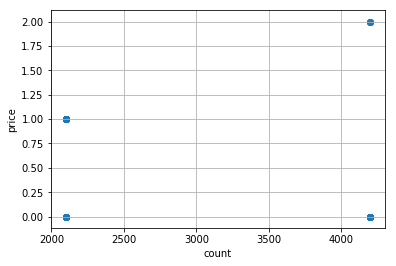

In [185]:
start = pd.datetime(2015, 10, 1)
end = pd.datetime(2015, 10, 31)
index = pd.date_range(start, end)

for idx in range(5, 10):
    #plt.figure(figsize=(16, 9))
    plt.figure()
    plt.scatter(price.loc[best_sold[idx], index], cnt_best_sold.loc[best_sold[idx], index])
    plt.grid()
    plt.ylabel('price')
    plt.xlabel('count')
    

In [187]:
train['sales'] = train.item_price*train.item_cnt_day

In [188]:
train.head()

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,City,Type,item_cat1,item_cat2,sales
0,2013-01-02,0,59,22154,999.00,1.0,27,1,3,9,999.00
1,2013-01-03,0,25,2552,899.00,1.0,8,5,12,56,899.00
2,2013-01-05,0,25,2552,899.00,-1.0,8,5,12,56,-899.00
3,2013-01-06,0,25,2554,1709.05,1.0,8,5,12,56,1709.05
4,2013-01-15,0,25,2555,1099.00,1.0,8,5,12,15,1099.00


In [208]:
shop_item = train.pivot_table(index=['shop_id', 'item_id'], columns='date_block_num', 
                              values=['item_price', 'item_cnt_day', 'sales'], 
                              aggfunc={'item_price': np.mean, 
                                       'item_cnt_day': np.sum,
                                       'sales': [np.sum, np.mean]}).fillna(0.0)

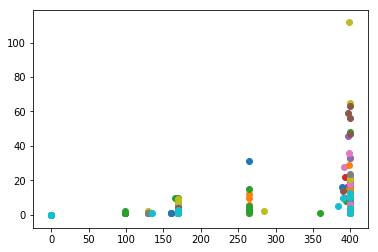

In [217]:
a = shop_item.loc[(slice(None), 30), 'item_price']
b = shop_item.loc[(slice(None), 30), 'item_cnt_day']
for idx in a.index:
    plt.scatter(a.loc[idx, :], b.loc[idx, :])